In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import tensorflow as tf
import numpy as np
import torch
import math
import pickle

In [4]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from matplotlib import pyplot
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, Concatenate
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.preprocessing import MinMaxScaler

In [5]:
ROA = '/content/drive/MyDrive/df_ROA_postu.pkl'
ROC = '/content/drive/MyDrive/df_ROC_postu.pkl'
RGA = '/content/drive/MyDrive/df_RGA_postu.pkl'
RGC = '/content/drive/MyDrive/df_RGC_postu.pkl'
with open(ROA, 'rb') as file:
    dataROA = pickle.load(file)
with open(ROC, 'rb') as file:
    dataROC = pickle.load(file)
with open(RGA, 'rb') as file:
    dataRGA = pickle.load(file)
with open(RGC, 'rb') as file:
    dataRGC = pickle.load(file)

In [6]:
dataROA = dataROA.reset_index(drop=True)
dataROC = dataROC.reset_index(drop=True)
dataRGA = dataRGA.reset_index(drop=True)
dataRGC = dataRGC.reset_index(drop=True)
dataROA

,id,x,y,Indice_VIS,Indice_SOM,Indice_VEST
0,gp53f,"[-0.012616, -0.082616, -0.052616, -0.192616, -...","[-1.861942, -1.621942, -1.121942, -0.101942, 0...",96.619423,98.347141,100.0
1,gp53f,"[-5.862616, -5.812616, -5.742616, -5.632616, -...","[21.378058, 20.848058, 20.408058, 19.798058, 1...",96.619423,98.347141,100.0
2,sr53f,"[0.207759, 0.277759, 0.337759, 0.497759, 0.577...","[-0.779408, -0.909408, -1.049408, -1.249408, -...",100.000000,97.697449,100.0
3,sr53f,"[5.017759, 4.857759, 4.747759, 4.577759, 4.477...","[0.930592, 1.150592, 1.330592, 1.570592, 1.700...",100.000000,97.697449,100.0
4,ug52m,"[-0.537764, -0.897764, -1.007764, -1.237764, -...","[-0.712413, -0.992413, -1.162413, -1.572413, -...",97.904325,100.000000,64.490641
...,...,...,...,...,...,...
121,mr52m,"[7.415484, 7.520404, 7.652581, 7.689898, 7.692...","[-15.222306, -15.426921, -15.525883, -15.67200...",100.000000,100.000000,100.0
122,pp52f,"[-0.673039, -0.751127, -0.916102, -1.088237, -...","[0.006697, -0.017919, -0.115228, -0.281042, -0...",100.000000,98.181830,100.0
123,pp52f,"[-0.938785, -1.199322, -1.365197, -1.531926, -...","[-0.2049, -0.218952, -0.277329, -0.397987, -0....",100.000000,98.181830,100.0
124,gl52f,"[-1.733532, -2.123532, -2.363532, -2.503532, -...","[-0.731503, -0.931503, -1.171503, -1.511503, -...",100.000000,100.000000,100.0


In [36]:
id_ROA = list(dataROA['id'])
id_ROC = list(dataROC['id'])
id_RGA = list(dataRGA['id'])
id_RGC = list(dataRGC['id'])

In [7]:
nulos_ROA_VIS = dataROA['Indice_VIS'].value_counts().get('-', 0)
nulos_ROC_VIS = dataROC['Indice_VIS'].value_counts().get('-', 0)
nulos_RGA_VIS = dataRGA['Indice_VIS'].value_counts().get('-', 0)
nulos_RGC_VIS = dataRGC['Indice_VIS'].value_counts().get('-', 0)

nulos_ROA_VEST = dataROA['Indice_VEST'].value_counts().get('-', 0)
nulos_ROC_VEST = dataROC['Indice_VEST'].value_counts().get('-', 0)
nulos_RGA_VEST = dataRGA['Indice_VEST'].value_counts().get('-', 0)
nulos_RGC_VEST = dataRGC['Indice_VEST'].value_counts().get('-', 0)

nulos_ROA_SOM = dataROA['Indice_SOM'].value_counts().get('-', 0)
nulos_ROC_SOM = dataROC['Indice_SOM'].value_counts().get('-', 0)
nulos_RGA_SOM = dataRGA['Indice_SOM'].value_counts().get('-', 0)
nulos_RGC_SOM = dataRGC['Indice_SOM'].value_counts().get('-', 0)

print("Valores nulos en el índice 'Indice_SOM':")
print("ROA:", nulos_ROA_SOM)
print("ROC:", nulos_ROC_SOM)
print("RGA:", nulos_RGA_SOM)
print("RGC:", nulos_RGC_SOM)


print("Valores nulos en el índice 'Indice_VIS':")
print("ROA:", nulos_ROA_VIS)
print("ROC:", nulos_ROC_VIS)
print("RGA:", nulos_RGA_VIS)
print("RGC:", nulos_RGC_VIS)

print("\nValores nulos en el índice 'Indice_VEST':")
print("ROA:", nulos_ROA_VEST)
print("ROC:", nulos_ROC_VEST)
print("RGA:", nulos_RGA_VEST)
print("RGC:", nulos_RGC_VEST)

Valores nulos en el índice 'Indice_SOM':
ROA: 0
ROC: 0
RGA: 0
RGC: 0
Valores nulos en el índice 'Indice_VIS':
ROA: 0
ROC: 0
RGA: 0
RGC: 0

Valores nulos en el índice 'Indice_VEST':
ROA: 8
ROC: 8
RGA: 8
RGC: 0


In [8]:
dataROA = dataROA.drop(dataROA[dataROA['Indice_VIS'] == '-'].index)
dataROC = dataROC.drop(dataROC[dataROC['Indice_VIS'] == '-'].index)
dataRGA = dataRGA.drop(dataRGA[dataRGA['Indice_VIS'] == '-'].index)
dataRGC = dataRGC.drop(dataRGC[dataRGC['Indice_VIS'] == '-'].index)

dataROA = dataROA.drop(dataROA[dataROA['Indice_VEST'] == '-'].index)
dataROC = dataROC.drop(dataROC[dataROC['Indice_VEST'] == '-'].index)
dataRGA = dataRGA.drop(dataRGA[dataRGA['Indice_VEST'] == '-'].index)
dataRGC = dataRGC.drop(dataRGC[dataRGC['Indice_VEST'] == '-'].index)

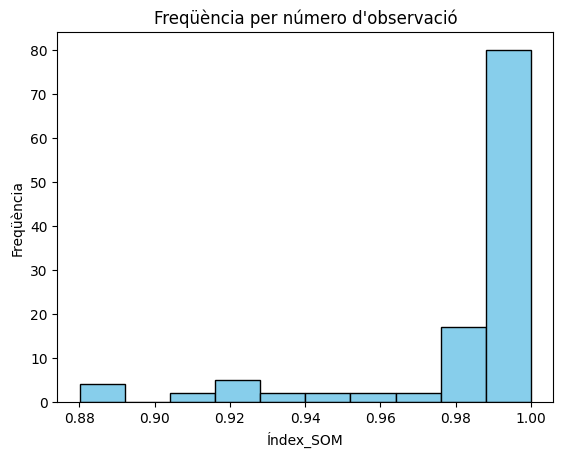

In [9]:
Índex_VIS = dataROC['Indice_VIS'].astype(float)/100
Índex_SOM = dataROC['Indice_SOM'].astype(float)/100
Índex_VEST = dataROC['Indice_VEST'].astype(float)/100
pyplot.hist(Índex_SOM, color='skyblue', edgecolor='black')
pyplot.title('Freqüència per número d\'observació')
pyplot.xlabel('Índex_SOM')
pyplot.ylabel('Freqüència')
pyplot.show()

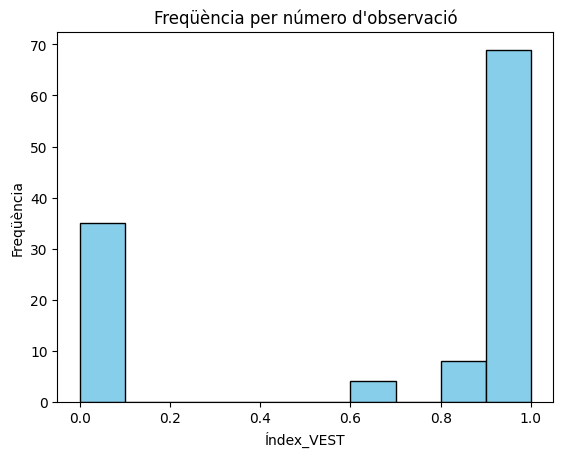

In [10]:
pyplot.hist(Índex_VEST, color='skyblue', edgecolor='black')
pyplot.title('Freqüència per número d\'observació')
pyplot.xlabel('Índex_VEST')
pyplot.ylabel('Freqüència')
pyplot.show()

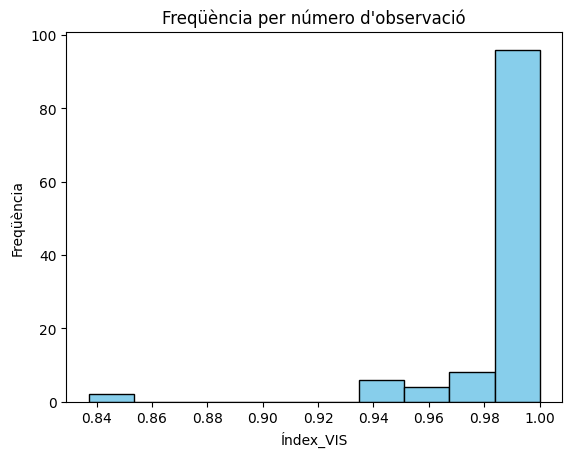

In [11]:
pyplot.hist(Índex_VIS, color='skyblue', edgecolor='black')
pyplot.title('Freqüència per número d\'observació')
pyplot.xlabel('Índex_VIS')
pyplot.ylabel('Freqüència')
pyplot.show()

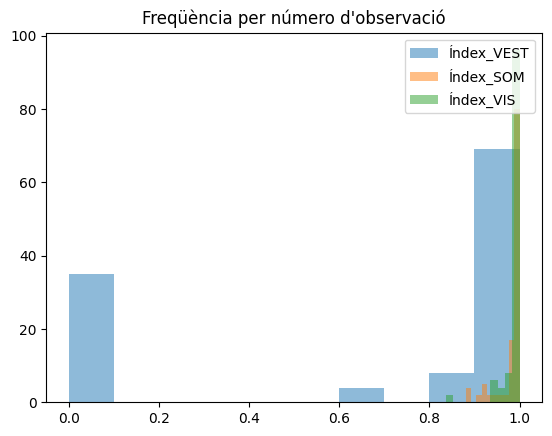

In [12]:
pyplot.hist(Índex_VEST,
         alpha=0.5, # the transaparency parameter
         label='Índex_VEST')

pyplot.hist(Índex_SOM,
         alpha=0.5,
         label='Índex_SOM')

pyplot.hist(Índex_VIS,
         alpha=0.5,
         label='Índex_VIS')

pyplot.legend(loc='upper right')
pyplot.title('Freqüència per número d\'observació')
pyplot.show()


In [49]:
X = dataRGC.drop(columns = ['id','Indice_VIS','Indice_VEST','Indice_SOM'])
X = X.reset_index(drop=True)
X.shape

(115, 2)

<ipython-input-50-776093779ba0>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Crear una nueva figura en cada iteración
<ipython-input-50-776093779ba0>:25: UserWarning: The label '_zs54' of <matplotlib.lines.Line2D object at 0x7ff7afb888e0> starts with '_'. It is thus excluded from the legend.
  plt.legend([id_RGC[i]], loc='upper right')
<ipython-input-50-776093779ba0>:25: UserWarning: The label '_zs54' of <matplotlib.lines.Line2D object at 0x7ff7afd80610> starts with '_'. It is thus excluded from the legend.
  plt.legend([id_RGC[i]], loc='upper right')


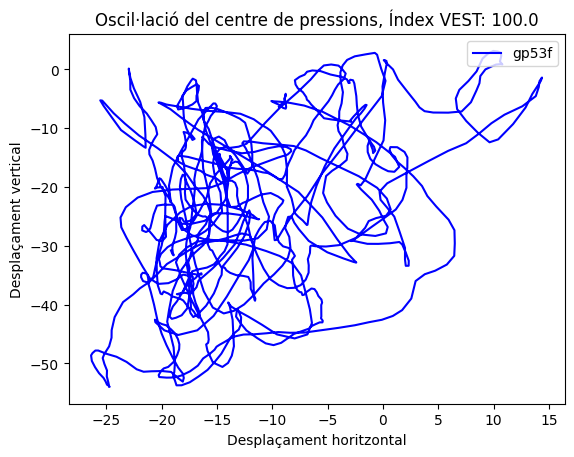

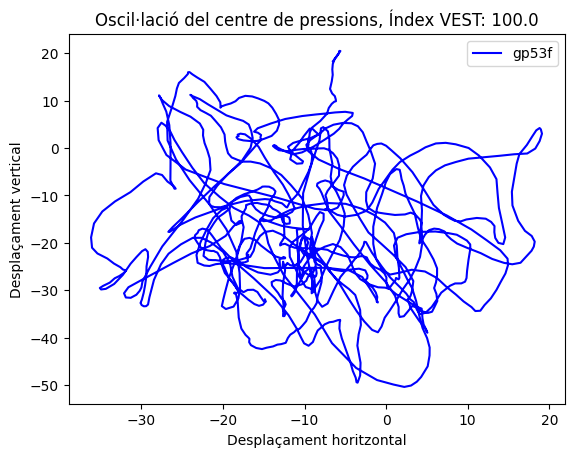

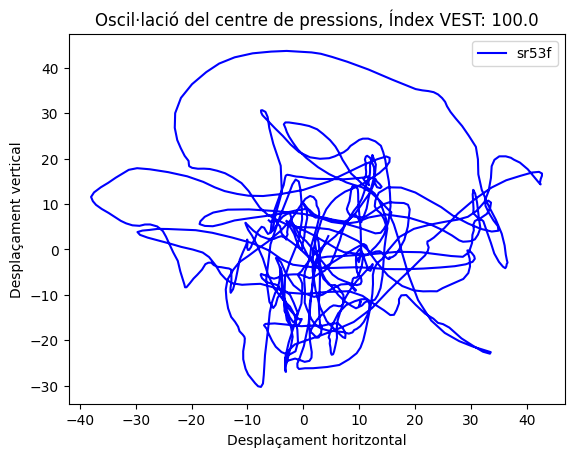

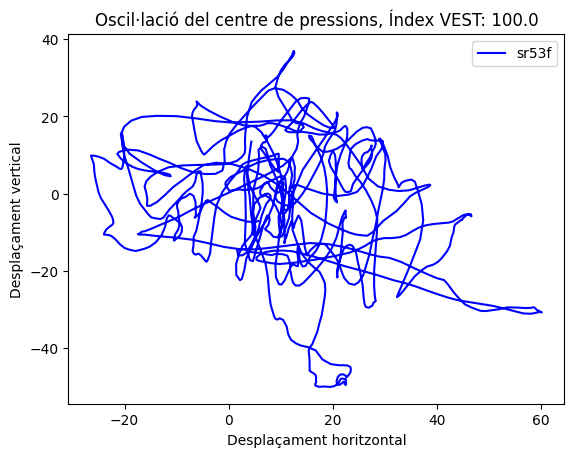

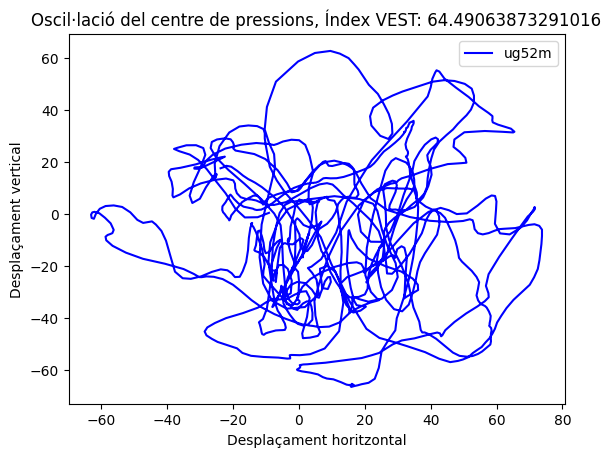

...

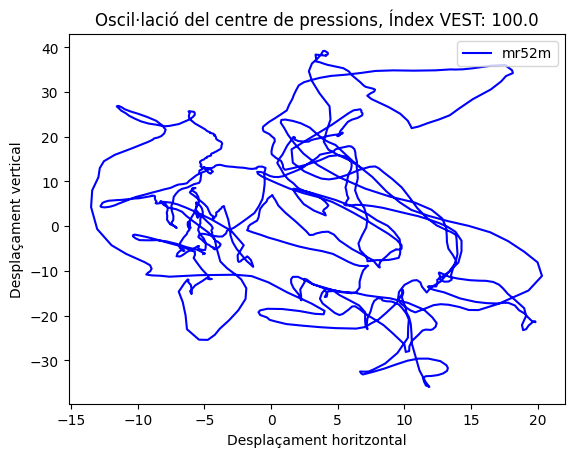

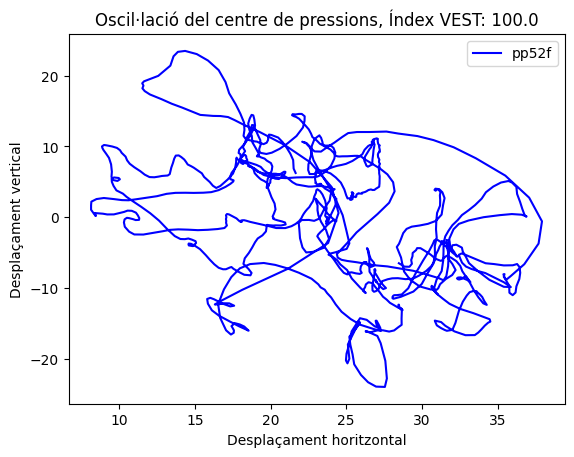

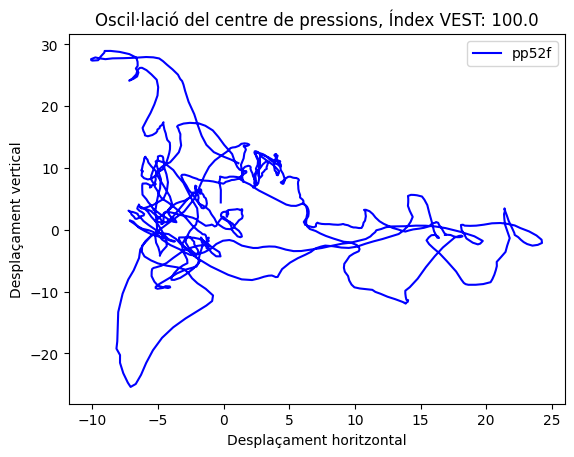

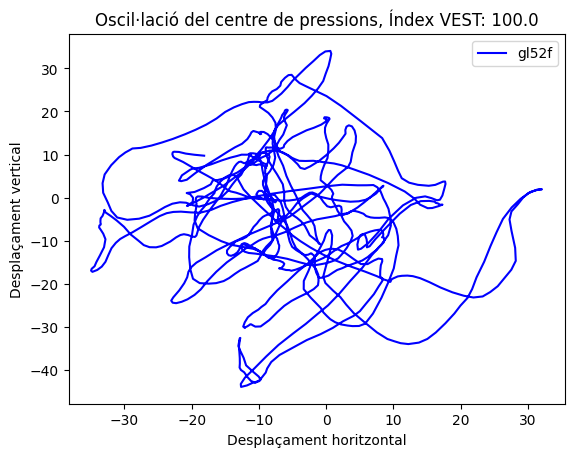

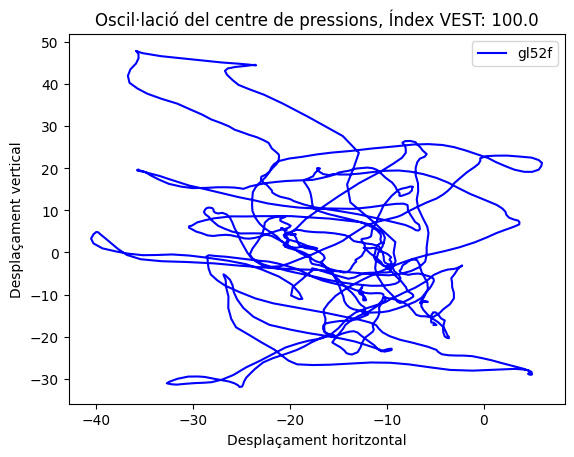

In [50]:
import matplotlib.pyplot as plt

Índex_VEST = dataRGC['Indice_VEST'].astype(float)/100

label = Índex_VEST.astype(np.float32)
label = label.reset_index(drop=True)
label = label*100

for i in range(X.shape[0]):
  plt.figure()

  x = [float(elemento) for elemento in X.loc[i, 'x']]
  y = [float(elemento) for elemento in X.loc[i, 'y']]


  plt.plot(x, y, linestyle='-', color='b')

  plt.xlabel('Desplaçament horitzontal')
  plt.ylabel('Desplaçament vertical')
  titol = 'Oscil·lació del centre de pressions, Índex VEST: {}'.format(label[i])
  plt.title(titol)

  plt.legend([id_RGC[i]], loc='upper right')


  nombre_archivo = "grafica_{}.png".format(i)
  if label[i]<0.5:

    ruta_archivo = '/content/drive/My Drive/desplaçament_RGC/positius/' + nombre_archivo
  else:

    ruta_archivo = '/content/drive/My Drive/desplaçament_RGC/negatius/' + nombre_archivo

  plt.savefig(ruta_archivo)

In [25]:
#DESPLAÇAMENT TOTAL???????
x = [float(elemento) for elemento in X.loc[0, 'x']]
y = [float(elemento) for elemento in X.loc[0, 'y']]

sumax,sumay = 0,0
for i in range(1,len(x)):
  des =  x[i] - x[i-1]
  sumax+= des
  desy =  y[i] - y[i-1]
  sumay+= desy

print(sumax, sumay, sumax+sumay )

7.080000000000018 -16.479999999999958 -9.39999999999994


In [ ]:
X_3d = np.empty((X.shape[0], X.shape[1], len(X.values[0][0])), dtype=object) #convertimos los datos en una matriz np
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        X_3d[i, j] = tf.constant(X.values[i][j])

In [ ]:
X_3d[0].shape #cada mostra te mida 2x1199 (dos files x i y)

(2, 1199)

In [ ]:
X_3d[0][0]

array([b'-0.012616', b'-0.082616', b'-0.052616', ..., b'-5.692616',
       b'-5.672616', b'-5.682616'], dtype=object)

In [ ]:
#funcio que redimensiona les dades a 2d per poder aplicar minmaxscaler, NORM PER CARACTERÍSTIQUES
class MinMaxScaler3D(MinMaxScaler):
    def fit_transform(self, X, y=None):
        x = np.reshape(X, newshape=(X.shape[0]*X.shape[1], X.shape[2]))
        return np.reshape(super().fit_transform(x, y=y), newshape=X.shape)

In [ ]:
scaler = MinMaxScaler3D()
X_3d = scaler.fit_transform(X_3d)

In [ ]:
X_3d[0][0]

array([0.52709543, 0.52949521, 0.53359509, ..., 0.40908138, 0.40797655,
       0.40909944])

In [ ]:
X_train = X_3d[:94].astype(np.float32)
y_train = Índex_VEST[:94].astype(np.float32)
y_Train = y_train.values
X_test = X_3d[94:].astype(np.float32)
y_test = Índex_VEST[94:].astype(np.float32)
y_test = y_test.values
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(94, 2, 1199) (94,) (24, 2, 1199) (24,)


In [ ]:
import keras
from keras.models import Model
from keras.layers import Layer, Flatten, LeakyReLU
from keras.layers import Input, Reshape, Dense, Lambda
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D

from keras import backend as K
#from keras.engine.base_layer import InputSpec

from keras.optimizers import Adam, SGD, RMSprop
#from keras.layers.normalization import BatchNormalization
from keras.losses import mse, binary_crossentropy
from keras import regularizers, activations, initializers, constraints
from keras.constraints import Constraint
from keras.callbacks import History

from keras.utils import plot_model
from keras.models import load_model

#from keras.utils.generic_utils import get_custom_objects

In [ ]:
class Autoencoder:

    def __init__(self, x_sz, y_sz, z_dim=64, variational=False):
        self.x_sz = x_sz #input dimensions
        self.y_sz = y_sz
        self.z_dim = z_dim
        self.variational = variational
        self.encoder = None
        self.decoder = None
        self.autoencoder = None

    def build_encoder(self):
        input_data = Input(shape=(self.x_sz,self.y_sz,))
        encoded = Dense(256, activation='relu')(input_data)
        encoded = Dense(128, activation='relu')(encoded)
        encoded = Dense(self.z_dim, activation='relu')(encoded)
        return input_data, encoded

    def build_decoder(self, encoded):
        decoded = Dense(128, activation='relu')(encoded)
        decoded = Dense(256, activation='relu')(decoded)
        decoded = Dense((self.y_sz), activation='sigmoid')(decoded)
        return decoded

    def train_autoencoder(self, x_train): #load=False):
        input_data, encoded = self.build_encoder()
        decoded = self.build_decoder(encoded)

        self.autoencoder = Model(input_data, decoded)
        self.autoencoder.compile(optimizer='adam', loss='mse')

        self.encoder = Model(input_data, encoded)
        decoder_input = Input(shape=(self.z_dim,))
        decoder_output = self.build_decoder(decoder_input)
        self.decoder = Model(decoder_input, decoder_output)

In [ ]:
autoencoder = Autoencoder(x_sz=X_train.shape[-2], y_sz=X_train.shape[-1], z_dim=64)
autoencoder.train_autoencoder(X_train)

In [ ]:
#reconstruccions del decoder
decoded_imgs = autoencoder.autoencoder.predict(X_test)

1/1 [==============================] - 0s 138ms/step


In [ ]:
import numpy as np
# Calcular el MSE promig
mse = np.mean(np.square(X_test - decoded_imgs))
print("MSE promedio: %.4f" % mse)

MSE promedio: 0.0204


In [ ]:
X_train_reduced = autoencoder.encoder.predict(X_train)
X_test_reduced = autoencoder.encoder.predict(X_test)

1/1 [==============================] - 0s 20ms/step


In [ ]:
from keras.models import Sequential
from keras.layers import GRU, Dense
#GRU
model = Sequential()
model.add(GRU(64, input_shape=(2, 64)))  # Capa GRU con 64 unidades y forma de entrada (2, 64)
model.add(Dense(128, activation='relu'))  # Capa densa con 128 unidades y activación ReLU
model.add(Dense(1, activation='sigmoid'))  # Capa de salida con una unidad y activación sigmoidal

# Compilar el modelo
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Imprimir un resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 64)                24960     
                                                                 
 dense_34 (Dense)            (None, 128)               8320      
                                                                 
 dense_35 (Dense)            (None, 1)                 129       
                                                                 
Total params: 33,409
Trainable params: 33,409
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(X_train_reduced, y_train, epochs=10, batch_size=16, validation_data=(X_test_reduced, y_test))

Epoch 1/10
6/6 [==============================] - 2s 96ms/step - loss: 0.2205 - accuracy: 0.4468 - val_loss: 0.1671 - val_accuracy: 0.7083
Epoch 2/10
6/6 [==============================] - 0s 9ms/step - loss: 0.2084 - accuracy: 0.4255 - val_loss: 0.1655 - val_accuracy: 0.7083
Epoch 3/10
6/6 [==============================] - 0s 8ms/step - loss: 0.2093 - accuracy: 0.4255 - val_loss: 0.1660 - val_accuracy: 0.7083
Epoch 4/10
6/6 [==============================] - 0s 7ms/step - loss: 0.2081 - accuracy: 0.4255 - val_loss: 0.1672 - val_accuracy: 0.7083
Epoch 5/10
6/6 [==============================] - 0s 12ms/step - loss: 0.2081 - accuracy: 0.4255 - val_loss: 0.1680 - val_accuracy: 0.7083
Epoch 6/10
6/6 [==============================] - 0s 8ms/step - loss: 0.2077 - accuracy: 0.4255 - val_loss: 0.1716 - val_accuracy: 0.7083
Epoch 7/10
6/6 [==============================] - 0s 8ms/step - loss: 0.2077 - accuracy: 0.4255 - val_loss: 0.1733 - val_accuracy: 0.7083
Epoch 8/10
6/6 [================

In [ ]:
y_pred = model.predict(X_test_reduced)
print(y_pred, y_test)

1/1 [==============================] - 0s 405ms/step
[[0.63753283]
 [0.6495326 ]
 [0.63083833]
 [0.63367766]
 [0.6206732 ]
 [0.6281904 ]
 [0.64139915]
 [0.6501154 ]
 [0.6243106 ]
 [0.6205266 ]
 [0.6368913 ]
 [0.59924996]
 [0.6392505 ]
 [0.6288464 ]
 [0.57160664]
 [0.64656806]
 [0.6347125 ]
 [0.6307854 ]
 [0.6226    ]
 [0.62068975]
 [0.6357248 ]
 [0.63955414]
 [0.6369962 ]
 [0.640725  ]] [1.         1.         0.         0.         1.         1.
 1.         1.         0.         0.         0.83178806 0.83178806
 0.83178806 1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.        ]
